In [4]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler, PolynomialFeatures, OneHotEncoder, normalize
from sklearn.linear_model import Ridge, Lasso, ElasticNet, LinearRegression, LassoCV, RidgeCV, ElasticNetCV, LogisticRegression 
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split, cross_validate, cross_val_score, ShuffleSplit, KFold, StratifiedKFold
from sklearn.metrics import log_loss, mean_squared_error, make_scorer, accuracy_score, precision_score, recall_score, plot_confusion_matrix
from sklearn.base import clone
from scipy.special import logit, expit
from sklearn import datasets
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier, NearestNeighbors
from pandas_profiling import ProfileReport
from imblearn.pipeline import Pipeline
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestClassifier

In [5]:
df = pd.read_csv('data/bigml_59c28831336c6604c800002a.csv')

In [6]:
celltocelldf = pd.read_csv('data/cell2celltrain.csv')

In [13]:
profile = ProfileReport(df, title="Churn Profiling Report")
profile

In [ ]:
# profile2 = ProfileReport(celltocelldf, title="Churn Profiling Report")
# profile2

In [7]:
celltocelldf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51047 entries, 0 to 51046
Data columns (total 58 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   CustomerID                 51047 non-null  int64  
 1   Churn                      51047 non-null  object 
 2   MonthlyRevenue             50891 non-null  float64
 3   MonthlyMinutes             50891 non-null  float64
 4   TotalRecurringCharge       50891 non-null  float64
 5   DirectorAssistedCalls      50891 non-null  float64
 6   OverageMinutes             50891 non-null  float64
 7   RoamingCalls               50891 non-null  float64
 8   PercChangeMinutes          50680 non-null  float64
 9   PercChangeRevenues         50680 non-null  float64
 10  DroppedCalls               51047 non-null  float64
 11  BlockedCalls               51047 non-null  float64
 12  UnansweredCalls            51047 non-null  float64
 13  CustomerCareCalls          51047 non-null  flo

In [ ]:
celltocelldf.head()

<AxesSubplot:xlabel='state', ylabel='count'>

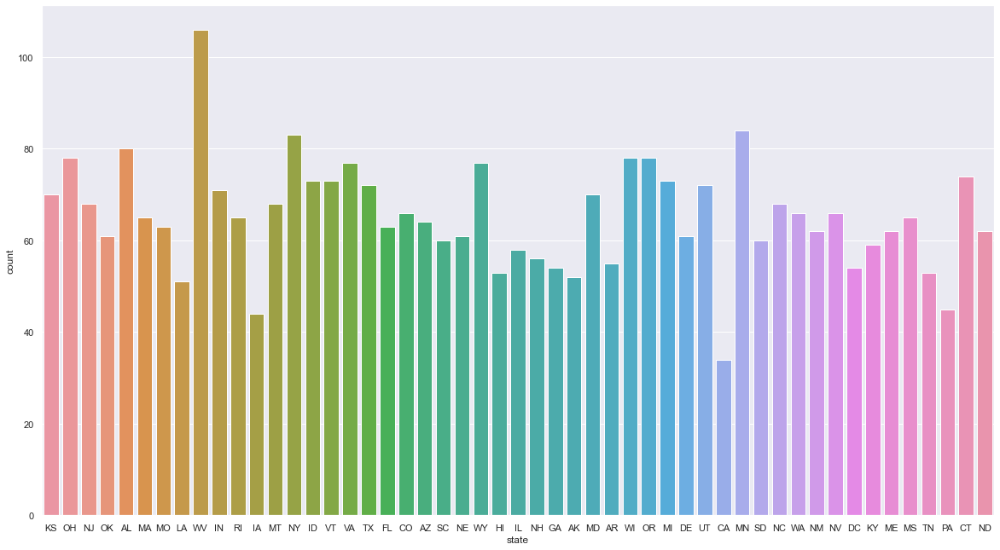

In [14]:
sns.set(rc={'figure.figsize':(20,11)})
sns.countplot(x ='state', data = df)

<AxesSubplot:xlabel='state', ylabel='Count'>

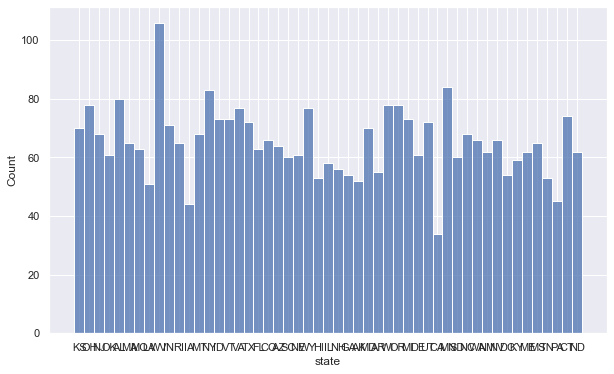

In [23]:
sns.histplot(binwidth=0.5, x="state",  data=df, stat="count", multiple="stack")

[Text(0.5, 1.0, 'Churned (t/f)')]

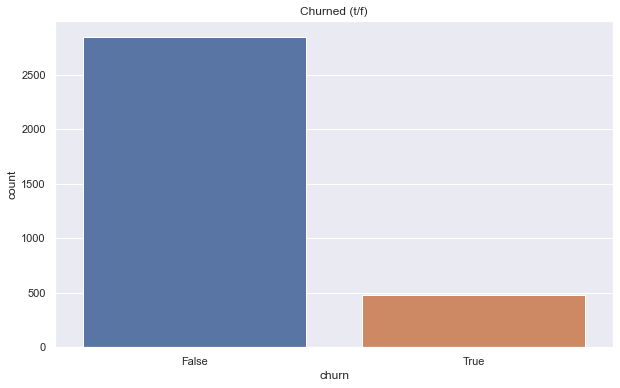

In [24]:
sns.set(rc={'figure.figsize':(10,6)})
sns.countplot(x ='churn', data = df).set(title='Churned (t/f)')

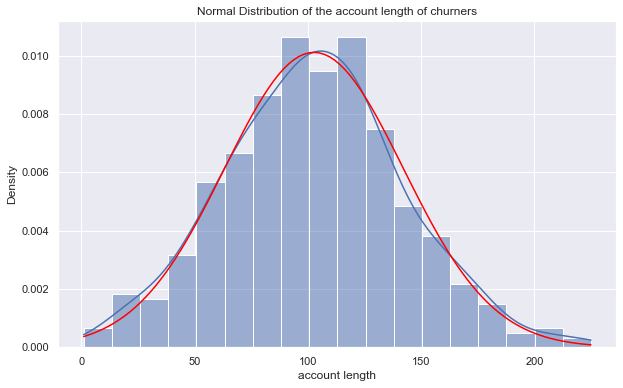

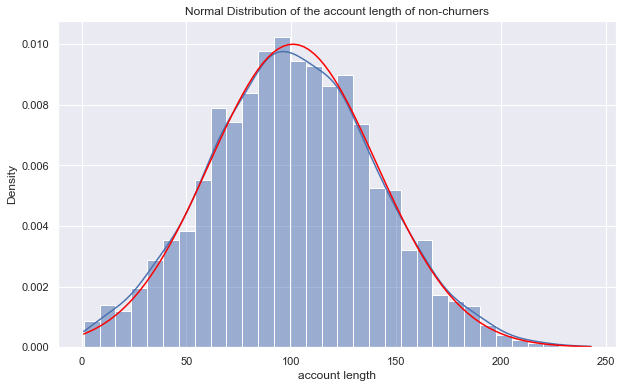

In [18]:
from scipy.stats import norm

def plotNormalDistribution(seriesName, titleName):
  
  mu = seriesName.mean()
  sigma = seriesName.std()

  density = pd.DataFrame()
  density["x"] = np.linspace(
      seriesName.min(), seriesName.max(), 100
  )
  density["pdf"] = norm.pdf(density["x"], mu, sigma)

  fig, ax = plt.subplots()
  sns.histplot(seriesName, ax=ax, kde=True, stat="density")
  ax.plot(density["x"], density["pdf"], color="red")
  plt.title(titleName)
  plt.show()
accountLengthDistOfChurners = (df[df['churn'] == True]['account length'])
accountLengthDistOfNonChurners = (df[df['churn'] == False]['account length'])
plotNormalDistribution(accountLengthDistOfChurners, 'Normal Distribution of the account length of churners')

plotNormalDistribution(accountLengthDistOfNonChurners, 'Normal Distribution of the account length of non-churners')

<__array_function__ internals>:5: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


[Text(0.5, 1.0, 'Churn by Area Code')]

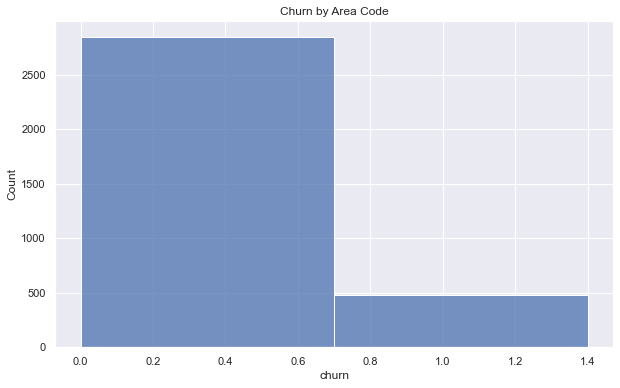

In [22]:
sns.histplot(binwidth=0.7, x="churn", data=df, stat="count", multiple="stack").set(title="Churn by Area Code")

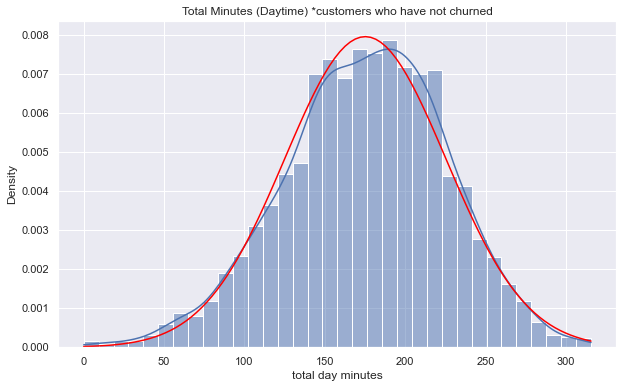

In [25]:
plotNormalDistribution(df[df['churn'] == False]['total day minutes'], 'Total Minutes (Daytime) *customers who have not churned')


In [7]:
pipeline =Pipeline([('scalar1',StandardScaler()),
                     ('pca1',PCA(n_components=2)),
                     ('lr_classifier',LogisticRegression(random_state=0))])
pipeline_dt=Pipeline([('scalar2',StandardScaler()),
                     ('pca2',PCA(n_components=2)),
                     ('dt_classifier',DecisionTreeClassifier())])
pipeline_randomforest=Pipeline([('scalar3',StandardScaler()),
                     ('pca3',PCA(n_components=2)),
                     ('rf_classifier',RandomForestClassifier())])

In [ ]:
pipelines = [pipeline_lr, pipeline_dt, pipeline_randomforest]
best_accuracy=0.0
best_classifier=0
best_pipeline=""

In [ ]:
pipe_dict = {0: 'Logistic Regression', 1: 'Decision Tree', 2: 'RandomForest'}

for pipe in pipelines:
    pipe.fit(X_train, y_train)

In [ ]:
for i,model in enumerate(pipelines):
    print("{} Test Accuracy: {}".format(pipe_dict[i],model.score(X_test,y_test)))

In [ ]:
X = 

In [ ]:
y = df['churn']

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(
    df, y, test_size=0.5, random_state=42)